#  Cheapest day before a flight to buy tickets prediction - Iteration 3

In [10]:

import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import math
import glob

from sklearn.metrics import  r2_score


In [11]:
import os
os.chdir("../") 
print(os.getcwd())

/Users/bobby/GitHub/Flight-Prices-Predicitons


# 📦 Data provisioning
The flights is gathered from **google flights**, using a *webscraper*. It includes data from the routes **SOF-EIN** , **EIN-SOF** , **EIN-ATH** , **ISTANBUL-AMS** , **MUNICH - NEW YORK**. The dataset includes data from **03.2025 - 12.2025**

In [12]:
csv_files = glob.glob("./datasets/iteration1/*.csv")

original_main_data = pd.concat([pd.read_csv(file, parse_dates=["departureDate", "record_timestamp"], low_memory=False) for file in csv_files], ignore_index=True)

main_data = original_main_data.copy(deep=True)


# 📃 Sample the data


In [13]:
main_data.sample(10)

,daysAgo,departureDate,price,departure_airport,arrival_airport,is_public_holiday,is_school_holiday,airline,near_holiday,record_timestamp
59050,218,2025-09-24,44,New York,"Washington, D.C.",False,False,Other,1.0,2025-02-18
47779,195,2025-09-29,40,Eindhoven,Sofia,False,False,Other,1.0,2025-03-18
14086,64,2025-04-24,104,Sofia,Eindhoven,False,False,Wizzair,-1.0,2025-02-19
49055,33,2025-04-09,43,New York,"Washington, D.C.",False,False,Delta,NaN,2025-03-07
38081,35,2025-04-23,58,Eindhoven,Sofia,False,False,Other,1.0,2025-03-19
5985,156,2025-07-01,113,Eindhoven,Athens,False,False,Transavia,-1.0,2025-01-26
1767,34,2025-04-22,175,Eindhoven,Athens,False,False,Transavia,-1.0,2025-03-19
49553,32,2025-04-18,50,New York,"Washington, D.C.",True,False,Other,-1.0,2025-03-17
45889,163,2025-08-29,40,Eindhoven,Sofia,False,True,Ryanair,1.0,2025-03-19
27049,92,2025-05-12,92,İstanbul,Amsterdam,False,False,Turkish Airlines,1.0,2025-02-09


# 🛠️ Preprocessing 

The step of preprocessing contains several activities to consider before we can start training the algorithm and produce a model that can predict our target variable, in this case the days before a flight, containing the cheapest tickets. 

In [14]:
print("Missing values per column:")
print(main_data.isna().sum())

Missing values per column:
daysAgo                  0
departureDate            0
price                    0
departure_airport        0
arrival_airport          0
is_public_holiday        0
is_school_holiday        0
airline                  0
near_holiday         15941
record_timestamp         0
dtype: int64


We can see that half of our data, 15k/30k has missing values on near_holiday. This is to be expected.

## Adding new feature - distance between departure and arrival airports

Using the following code, we can calculate the distance between the two airport's coordinates, which will be a useful feature for our model.


In [15]:
airport_coords = {
    'New York': (40.7128, -74.0060),
    'Amsterdam': (52.3676, 4.9041),
    'Athens': (37.9838, 23.7275),
    'Eindhoven': (51.4416, 5.4697),
    'Sofia': (42.6975, 23.3242),
    'Washington, D.C.': (38.8951, -77.0364),
    'İstanbul': (41.0082, 28.9784)
}

# Function to calculate Haversine distance
# Source: https://stackoverflow.com/questions/25711895/the-result-by-haversine-formula-is-meter-o-kmeter
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Radius of Earth in km
    phi1, phi2 = math.radians(lat1), math.radians(lat2)
    delta_phi = math.radians(lat2 - lat1)
    delta_lambda = math.radians(lon2 - lon1)

    a = math.sin(delta_phi / 2.0) ** 2 + math.cos(phi1) * math.cos(phi2) * math.sin(delta_lambda / 2.0) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))

    return R * c  # Distance in km

def calculate_distance(row):
    dep = row['departure_airport']
    arr = row['arrival_airport']
    if dep in airport_coords and arr in airport_coords:
        lat1, lon1 = airport_coords[dep]
        lat2, lon2 = airport_coords[arr]
        return haversine_distance(lat1, lon1, lat2, lon2)
    else:
        return None  # Handle missing airport coordinates

main_data['airport_distance_km'] = main_data.apply(calculate_distance, axis=1)
main_data.sample(10)

,daysAgo,departureDate,price,departure_airport,arrival_airport,is_public_holiday,is_school_holiday,airline,near_holiday,record_timestamp,airport_distance_km
2106,67,2025-04-28,130,Eindhoven,Athens,False,True,Transavia,-1.0,2025-02-20,2067.423123
47935,225,2025-10-02,90,Eindhoven,Sofia,False,False,Other,NaN,2025-02-19,1658.335311
53901,149,2025-06-30,91,New York,"Washington, D.C.",False,False,Delta,-1.0,2025-02-01,328.393017
9063,173,2025-08-21,59,Eindhoven,Athens,False,True,Transavia,-1.0,2025-03-01,2067.423123
12760,26,2025-04-02,30,Sofia,Eindhoven,False,False,Wizzair,NaN,2025-03-07,1658.335311
11595,245,2025-10-02,97,Eindhoven,Athens,False,False,Transavia,NaN,2025-01-30,2067.423123
16380,127,2025-06-02,86,Sofia,Eindhoven,False,False,Wizzair,NaN,2025-01-26,1658.335311
50060,83,2025-04-27,115,New York,"Washington, D.C.",False,True,Delta,-1.0,2025-02-03,328.393017
40297,113,2025-05-30,67,Eindhoven,Sofia,False,False,Wizzair,1.0,2025-02-06,1658.335311
50553,87,2025-05-06,47,New York,"Washington, D.C.",True,False,Republic American,1.0,2025-02-08,328.393017


The code performs feature engineering and encoding to prepare the data for machine learning. It converts departureDate and record_timestamp into Unix timestamps for numerical processing. The near_holiday column is one-hot encoded to avoid misinterpretation of its -1, 0, and 1 values as ordered. It also extracts the weekday from the departureDate as a new feature. Finally, categorical variables such as airline, departure_airport, and arrival_airport are converted to numeric labels using label encoding

In [16]:
# Feature engineering
main_data['departure_date_unix'] = main_data['departureDate'].astype(np.int64) // 10**9
main_data['record_timestamp_unix'] = main_data['record_timestamp'].astype(np.int64) // 10**9
main_data = pd.get_dummies(main_data, columns=['near_holiday']) # as the columns is -1, 0, 1 which messes with the algorithm
main_data['departure_weekday'] = main_data['departureDate'].dt.weekday

# Encode categorical variables
le_dep = LabelEncoder()
le_arr = LabelEncoder()
le_airline = LabelEncoder()
main_data['airline'] = le_airline.fit_transform(main_data['airline'])
main_data['departure_airport'] = le_dep.fit_transform(main_data['departure_airport'])
main_data['arrival_airport'] = le_arr.fit_transform(main_data['arrival_airport'])


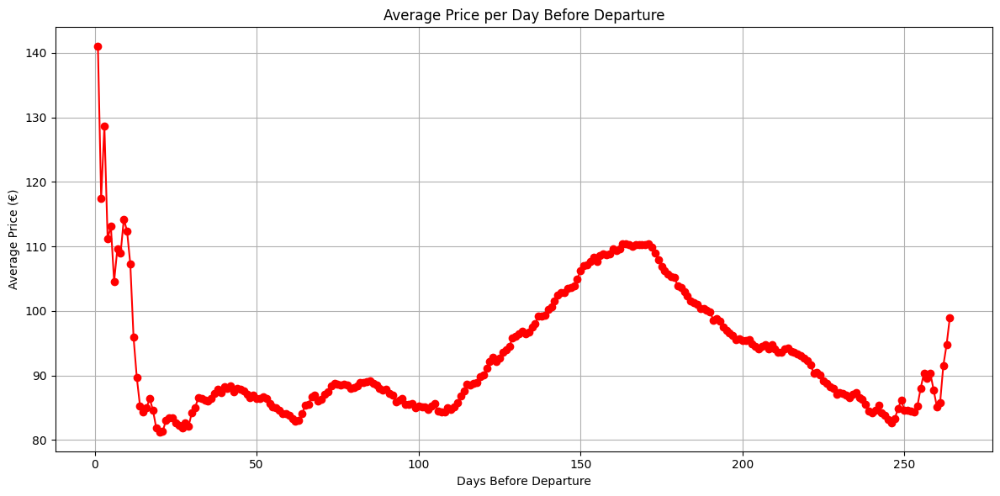

In [17]:
def plot_avg_price_per_day(df, x_col='daysAgo', y_col='price'):
    avg_per_day = df.groupby(x_col)[y_col].mean().reset_index().sort_values(by=x_col)

    plt.figure(figsize=(12, 6))
    plt.plot(avg_per_day[x_col], avg_per_day[y_col], marker='o', linestyle='-', color='red')
    plt.title('Average Price per Day Before Departure')
    plt.xlabel('Days Before Departure')
    plt.ylabel('Average Price (€)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()
plot_avg_price_per_day(main_data)


The chart reveals that flight prices are highest very close to the departure date and tend to drop significantly when booked around 30–90 days in advance. Prices then gradually increase again when booking far in advance, especially beyond 120 days. This pattern suggests that the cheapest tickets are typically available when booking 1–3 months before departure

## Marking the cheapest price for each flight

In [18]:
# Step 1: Group and find the cheapest record for each flight
cheapest_rows = main_data.loc[main_data.groupby(
    ['departureDate', 'departure_airport', 'arrival_airport']
)['price'].idxmin()] #Return the row label of the minimum value

# Step 2: Create a mapping from flight to its cheapest daysAgo
cheapest_map = cheapest_rows.set_index(
    ['departureDate', 'departure_airport', 'arrival_airport']
)['daysAgo'].to_dict()

# Step 3: Map it back to the full data
main_data['cheapest_day_future'] = main_data.apply(
    lambda row: cheapest_map.get((row['departureDate'], row['departure_airport'], row['arrival_airport'])),
    axis=1
)

# Drop rows where mapping failed (e.g. missing future prices)
main_data.dropna(subset=['cheapest_day_future'], inplace=True)
main_data['cheapest_day_future'] = main_data['cheapest_day_future'].astype(int)

### 💡 Feature Selection

Now we will create several graphs to visualize relationships between the features of the dataset


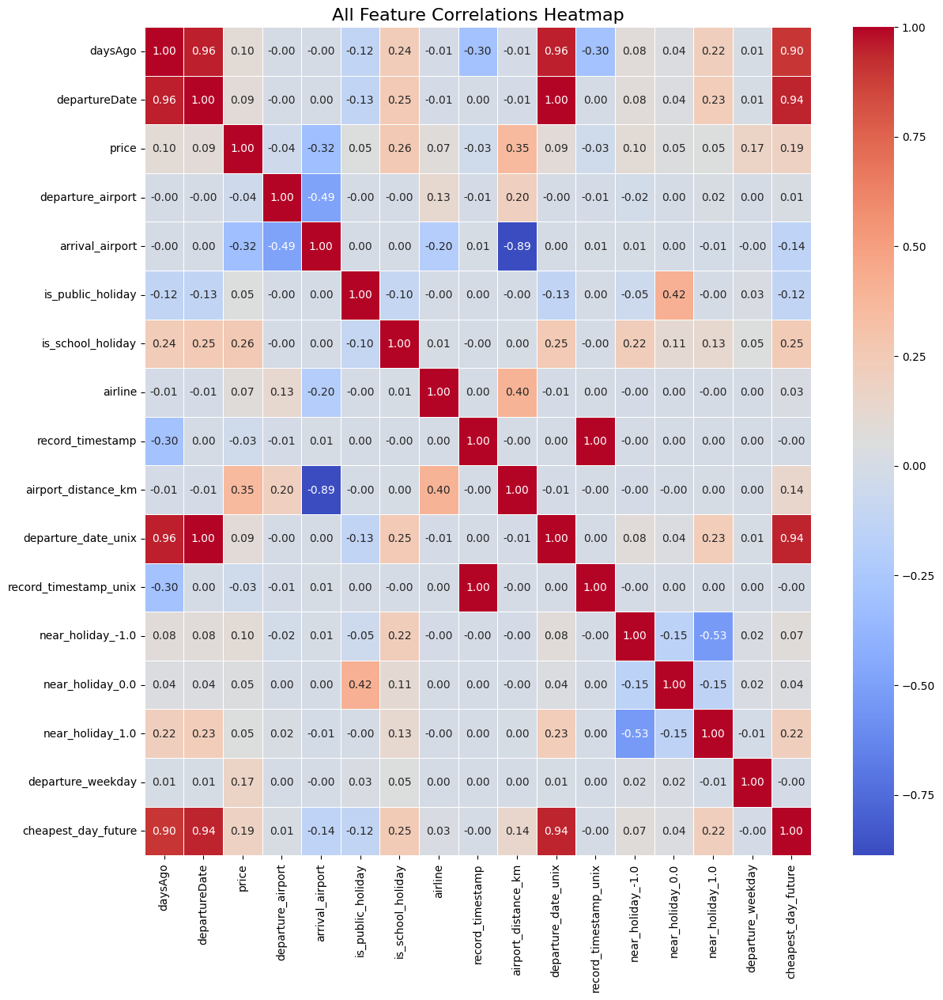

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

correlations = main_data.corr()

plt.figure(figsize=(min(20, 0.8 * len(correlations)), min(20, 0.8 * len(correlations))))  

sns.heatmap(
    correlations, 
    annot=True, 
    fmt=".2f",
    linewidths=0.5,
    cmap="coolwarm",
)

plt.title("All Feature Correlations Heatmap", fontsize=16)
plt.show()

In [20]:
correlation_target = main_data.corr()['cheapest_day_future'].sort_values(ascending=False)
print(correlation_target)

cheapest_day_future      1.000000
departure_date_unix      0.943693
departureDate            0.943693
daysAgo                  0.901768
is_school_holiday        0.245841
near_holiday_1.0         0.217296
price                    0.187732
airport_distance_km      0.142290
near_holiday_-1.0        0.073063
near_holiday_0.0         0.040271
airline                  0.026380
departure_airport        0.011745
record_timestamp        -0.000653
record_timestamp_unix   -0.000653
departure_weekday       -0.004502
is_public_holiday       -0.123838
arrival_airport         -0.142831
Name: cheapest_day_future, dtype: float64


The features most correlated with cheapest_day_future are daysAgo, departure_date_unix, and record_timestamp_unix, indicating that time-related variables play the biggest role in predicting the cheapest booking day. Other features like airport_distance_km, near_holiday flags, and airline have low correlation and may contribute little predictive power individually.

# Selecting features and target

In [21]:

features = [
    'price', 'airport_distance_km',
    'near_holiday_-1.0', 'near_holiday_0.0', 'near_holiday_1.0',
    'departure_airport', 'arrival_airport',
    'daysAgo', 'departure_weekday'
]

target = 'cheapest_day_future'

X = main_data[features]
y = main_data[target]

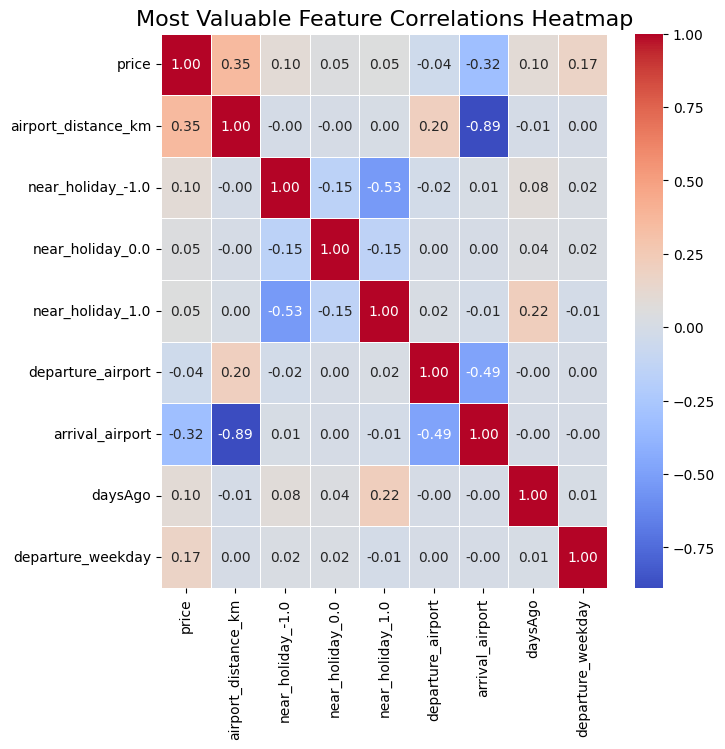

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

correlations = main_data[features].corr()

plt.figure(figsize=(min(20, 0.8 * len(correlations)), min(20, 0.8 * len(correlations))))  

sns.heatmap(
    correlations, 
    annot=True, 
    fmt=".2f",
    linewidths=0.5,
    cmap="coolwarm",
)

plt.title("Most Valuable Feature Correlations Heatmap", fontsize=16)
plt.show()

The heatmap shows that most features have low correlations, indicating they contribute distinct information to the model. Airport_distance_km and arrival_airport have the strongest relationships, with arrival_airport showing a strong negative correlation with both distance and price. This suggests that certain arrival airports and longer distances tend to be associated with higher ticket prices

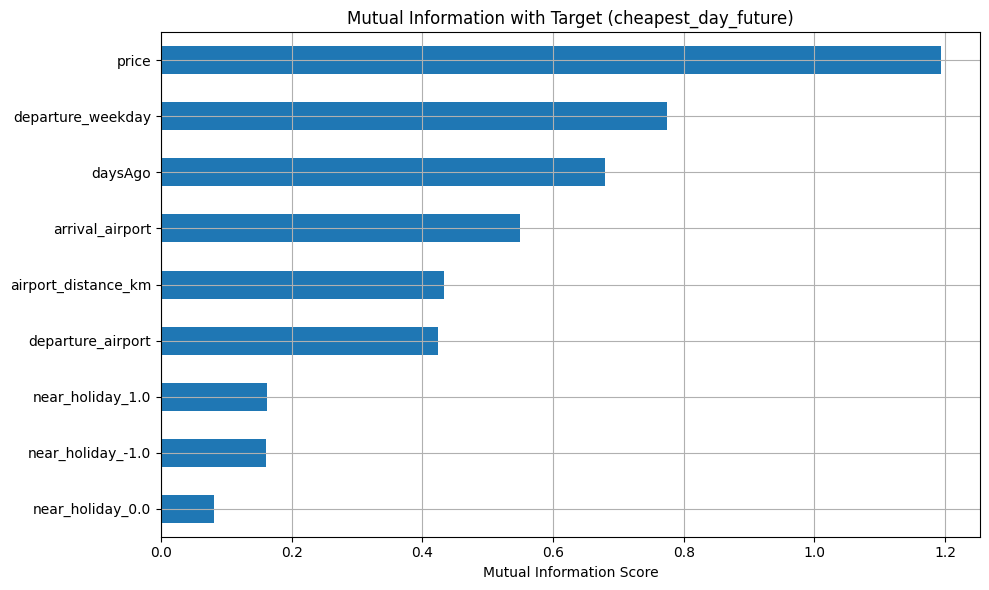

In [23]:
from sklearn.feature_selection import mutual_info_regression
from sklearn.preprocessing import LabelEncoder

X_encoded = X.copy()
for col in X_encoded.select_dtypes(include='object').columns:
    X_encoded[col] = LabelEncoder().fit_transform(X_encoded[col])

# Calculate mutual information ("amount of information" obtained about one random variable by observing the other random variable)
mi_scores = mutual_info_regression(X_encoded, y)
mi_series = pd.Series(mi_scores, index=X_encoded.columns).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
mi_series.plot(kind='barh')
plt.title('Mutual Information with Target (cheapest_day_future)')
plt.xlabel('Mutual Information Score')
plt.gca().invert_yaxis()
plt.grid(True)
plt.tight_layout()
plt.show()

The feature with the highest mutual information score is price, indicating it provides the most information about the target (cheapest_day_future). Other important features include departure_weekday, daysAgo, and arrival_airport, all showing moderate relevance. Features related to holidays have the lowest scores, suggesting that proximity to holidays has minimal influence on the model’s prediction.

# 🪓 Splitting into train/test
80% of the data is used for training, and 20% for testing

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print("There are in total", len(X), "observations, of which", len(X_train), "are now in the train set, and", len(X_test), "in the test set.")

There are in total 59996 observations, of which 47996 are now in the train set, and 12000 in the test set.


# 🧬 Modelling

## Previously used algorhitm Linear Regression

In [25]:
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)

Adding the last learned algorhitm RandomForestRegression to compare the algorhitms

In [26]:

rfr = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
rfr.fit(X_train, y_train)
rfr_pred = rfr.predict(X_test)

Now lets visualize part of the decision tree to see how it actually works from the inside

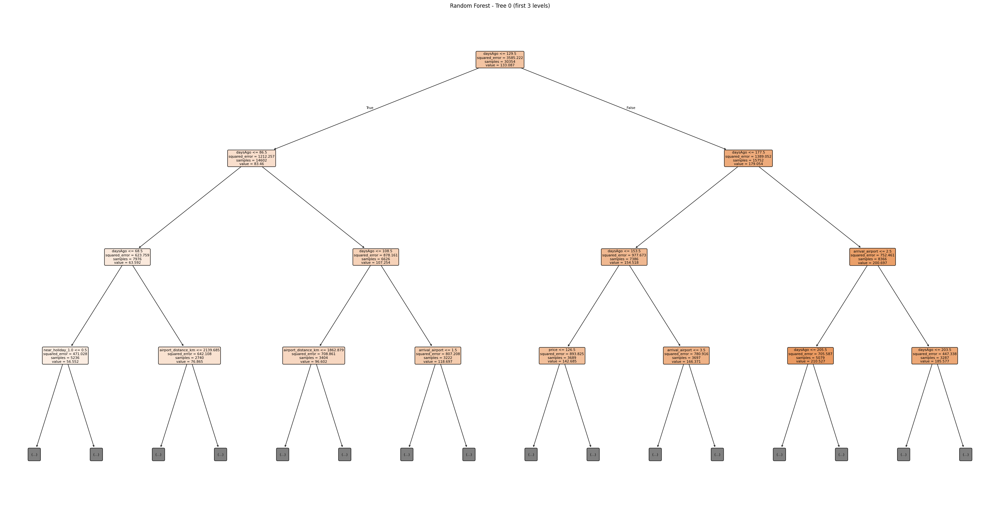

In [27]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

tree = rfr.estimators_[0] 

plt.figure(figsize=(40, 20))
plot_tree(tree, feature_names=X.columns, filled=True, rounded=True, max_depth=3)
plt.title("Random Forest - Tree 0 (first 3 levels)")
plt.show()

This decision tree from the Random Forest model shows that daysAgo is the primary splitting feature, indicating it’s the most influential factor in predicting when a ticket is cheapest. Other important splits involve price, arrival_airport, and airport_distance_km, which refine the prediction based on flight specifics and route characteristics. While near_holiday appears at a deeper node, its limited presence suggests a weaker influence compared to the time-related and location-based features

In [28]:
from supertree import SuperTree

st = SuperTree(
    rfr,                
    X_train.values,     
    y_train,            
    list(X_train.columns), 
    "cheapest_day_future"      
)

# Show the first tree at start
st.show_tree(which_tree=0)

Using the SuperTree library, we can interactively follow the decission of the RandomForestResgression and we can dynamically change the depth, zoom in or out and click on the generated charts, which makes it easier to follow the decision boundaries

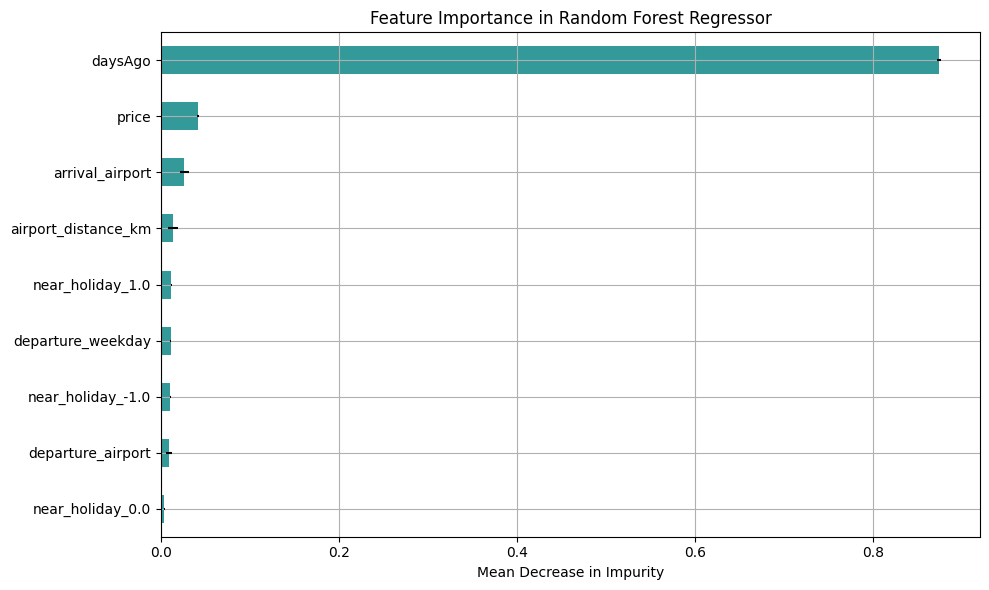

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

features = X.columns 

# Get feature importances
importances = pd.Series(rfr.feature_importances_, index=features)

# Get standard deviation across all decision trees
std_dev = np.std([tree.feature_importances_ for tree in rfr.estimators_], axis=0)

# Plot
plt.figure(figsize=(10, 6))
importances.sort_values().plot.barh(xerr=std_dev[np.argsort(importances)], color='teal', alpha=0.8)
plt.title("Feature Importance in Random Forest Regressor")
plt.xlabel("Mean Decrease in Impurity")
plt.tight_layout()
plt.grid(True)
plt.show()

The feature importance plot shows that daysAgo is by far the most influential variable, contributing the most to the model’s predictive performance. Other features like price, arrival_airport, and airport_distance_km have minor but non-negligible impact, while the remaining features contribute very little. This suggests the timing before departure is the most critical factor in predicting the cheapest day to buy a flight.

# 🔬 Evaluation
In order to shed some light on the results a classification report can be printed. 

In [30]:
# Calculate evaluation metrics
r2_lr = r2_score(y_test, lr_pred)
r2_rfr = r2_score(y_test, rfr_pred)

print(f"R² Score LR: {r2_lr}")
print(f"R² Score RFR: {r2_rfr}")

R² Score LR: 0.8426295914370998
R² Score RFR: 0.9381802268368378


The random forest give a very nice accuracy result, ill try to use boosting to improve the score for the Linear Regression

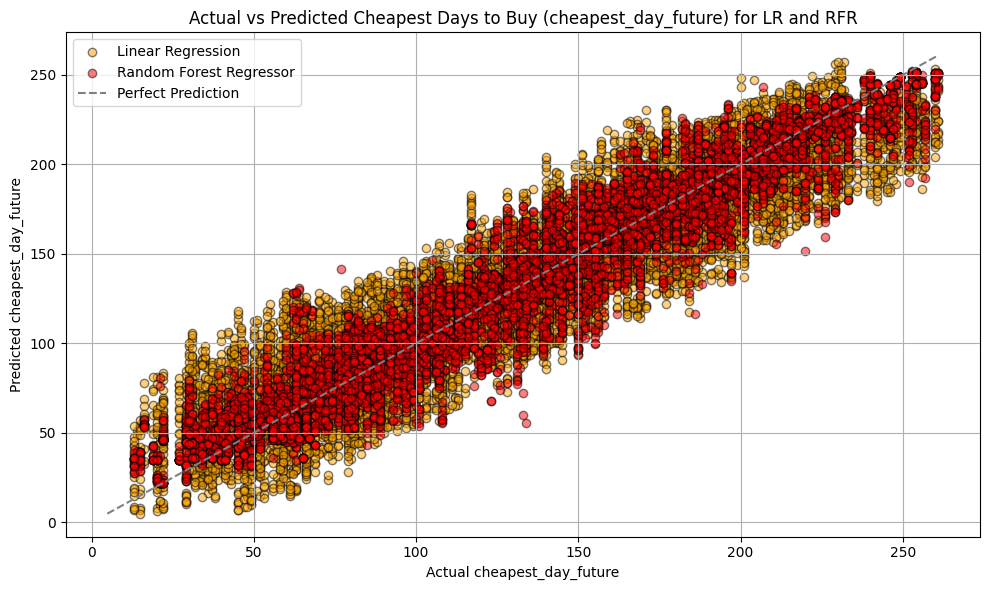

In [31]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Scatter plot: Actual vs Predicted
plt.scatter(y_test, lr_pred, alpha=0.5, color='orange', edgecolors='k', label='Linear Regression')
plt.scatter(y_test, rfr_pred, alpha=0.5, color='red', edgecolors='k', label='Random Forest Regressor')

# Add a reference line (perfect predictions)
min_val = min(min(y_test), min(lr_pred), min(rfr_pred))
max_val = max(max(y_test), max(lr_pred), max(rfr_pred))
plt.plot([min_val, max_val], [min_val, max_val], color='gray', linestyle='--', label='Perfect Prediction')

# Labels, title, legend
plt.xlabel('Actual cheapest_day_future')
plt.ylabel('Predicted cheapest_day_future')
plt.title('Actual vs Predicted Cheapest Days to Buy (cheapest_day_future) for LR and RFR')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

After removing a data leak from one of the columns, we see that both algorhitms have some differences in reference to the actual values. This is to be expected as the correlations are not that high. Now however, with the slightly lower accuracy we can try to add the AdaBoost and/or Stacking

In [32]:
import pandas as pd

comparison_df = pd.DataFrame({
    'Actual': y_test.reset_index(drop=True)[:20],
    'Linear Regression': lr_pred[:20].round(2),
    'Random Forest': rfr_pred[:20].round(2),
})

# Add residuals
comparison_df['LR Residual'] = (comparison_df['Actual'] - comparison_df['Linear Regression']).round(2)
comparison_df['RFR Residual'] = (comparison_df['Actual'] - comparison_df['Random Forest']).round(2)

# Display
print(comparison_df)

    Actual  Linear Regression  Random Forest  LR Residual  RFR Residual
0      210             213.82         205.21        -3.82          4.79
1      207             177.40         204.54        29.60          2.46
2      249             212.52         249.00        36.48          0.00
3      184             186.96         177.45        -2.96          6.55
4      202             193.78         200.56         8.22          1.44
5      180             138.09         159.76        41.91         20.24
6      159             137.97         159.38        21.03         -0.38
7      190             201.97         192.23       -11.97         -2.23
8      215             205.15         230.26         9.85        -15.26
9       42              62.24          45.78       -20.24         -3.78
10      85              60.17          42.97        24.83         42.03
11     165             154.19         151.36        10.81         13.64
12     192             199.31         191.03        -7.31       

The residuals table reveals that the Random Forest Regressor (RFR) generally produces smaller errors than the Linear Regression (LR) model, especially in cases with larger deviations (e.g., rows 1, 2, 5, 10). The LR model tends to underpredict or overpredict more severely, as seen by higher residuals in several rows. This confirms that the Random Forest model captures non-linear patterns in the data more effectively, leading to improved accuracy.

In [33]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

def compare_lr_vs_rf(X_train, X_test, y_train, y_test, max_depth=None, yLim=None):
    rf_train_scores, rf_test_scores = [], []
    lr_train_scores, lr_test_scores = [], []

    estimators_range = range(10, 211, 20)

    for n in estimators_range:
        rf = RandomForestRegressor(n_estimators=n, max_depth=max_depth, random_state=21, n_jobs=-1)
        rf.fit(X_train, y_train)
        rf_train_scores.append(rf.score(X_train, y_train))
        rf_test_scores.append(rf.score(X_test, y_test))

        lr = LinearRegression()
        lr.fit(X_train, y_train)
        lr_train_scores.append(lr.score(X_train, y_train))
        lr_test_scores.append(lr.score(X_test, y_test))

    plt.figure(figsize=(12, 6))

    # Plot curves
    plt.plot(estimators_range, rf_train_scores, marker='o', linestyle='--', label=f'RF Train (max_depth={max_depth})', linewidth=2)
    plt.plot(estimators_range, rf_test_scores, marker='o', label=f'RF Test (max_depth={max_depth})', linewidth=2)
    plt.plot(estimators_range, lr_train_scores, marker='s', linestyle='--', label='LR Train (constant)', linewidth=2)
    plt.plot(estimators_range, lr_test_scores, marker='s', label='LR Test (constant)', linewidth=2)

    plt.xlabel('Number of Estimators (for RF only)')
    plt.ylabel('R² Score')
    plt.title('Train vs Test: Random Forest vs Linear Regression')
    plt.grid(True)
    plt.xlim(estimators_range[0], estimators_range[-1])

    # === Optional Y-axis lower limit ===
    if yLim is not None:
        plt.ylim(bottom=yLim)

    plt.legend()
    plt.tight_layout()
    plt.show()

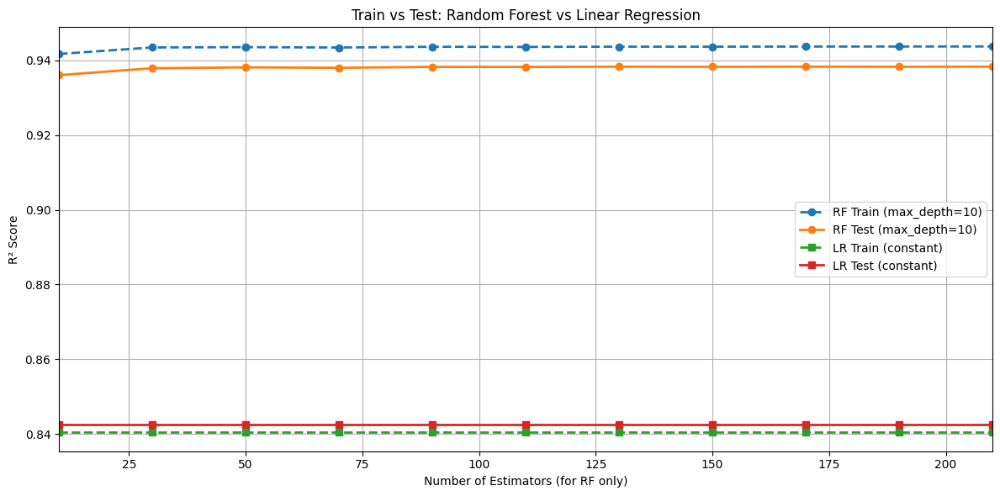

In [34]:
compare_lr_vs_rf(X_train, X_test, y_train, y_test, max_depth=10)

Random Forest (max_depth=10):
-	Train R² ≈ 0.990–0.992, very high — suggesting near-perfect fit on training data.
-	Test R² ≈ 0.989–0.990, almost identical to train — indicating no overfitting and strong generalization.
-	Increasing the number of estimators improves consistency but brings minimal gain after ~50 estimators.

Linear Regression:
-	Flat performance across all points (as expected, since it’s not affected by n_estimators).
-	Train & Test R² ≈ 0.918, consistently lower than Random Forest, meaning it underfits slightly and misses non-linear patterns in the data.

After discussions with teachers, they suggested that the chart should start at Y-0 as to not give false impressions as both alhorhitms have less than 10% difference in accuracy but the charts makes a false impression.

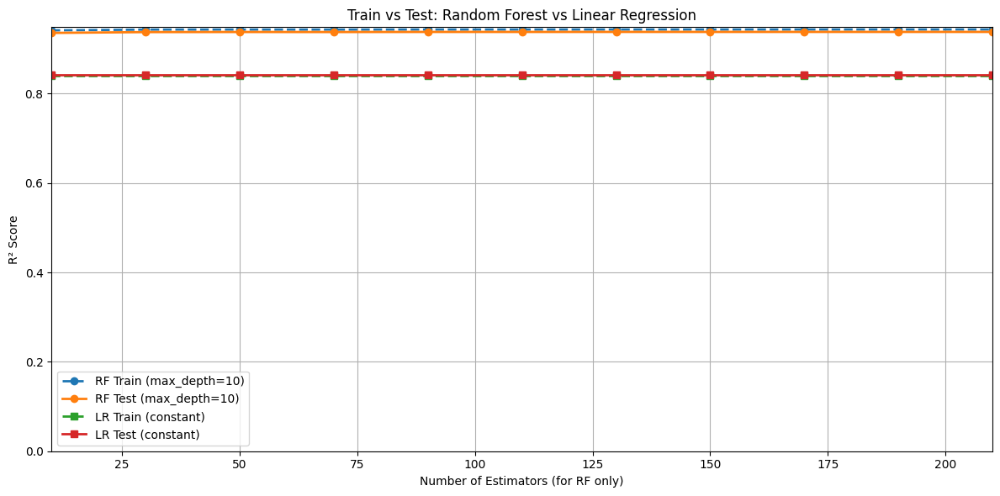

In [35]:
compare_lr_vs_rf(X_train, X_test, y_train, y_test, max_depth=10, yLim=0)

# Boosting
Lastly, we can try to boost our results to near perfection using the knowledge from the Optimization Lecture -  Boosting / Stacking

In [36]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

def compare_rf_vs_adaboost(X_train, X_test, y_train, y_test, max_depth, learning_rate=0.5, yLim = None):
    rf_train_scores, rf_test_scores = [], []
    ada_train_scores, ada_test_scores = [], []

    estimators_range = range(10, 211, 20)

    for n in estimators_range:
        # === Random Forest ===
        rf = RandomForestRegressor(n_estimators=n, max_depth=max_depth, random_state=21, n_jobs=-1)
        rf.fit(X_train, y_train)
        rf_train_scores.append(rf.score(X_train, y_train))
        rf_test_scores.append(rf.score(X_test, y_test))

        # === AdaBoost  ===
        ada = AdaBoostRegressor(
            estimator=DecisionTreeRegressor(max_depth=max_depth),
            n_estimators=n,
            learning_rate=learning_rate,
            random_state=21
        )
        ada.fit(X_train, y_train)
        ada_train_scores.append(ada.score(X_train, y_train))
        ada_test_scores.append(ada.score(X_test, y_test))

    # === Plot Results ===
    plt.figure(figsize=(12, 6))
    
        # === Optional Y-axis lower limit ===
    if yLim is not None:
        plt.ylim(bottom=yLim)

    # Random Forest
    plt.plot(estimators_range, rf_train_scores, marker='o', linestyle='--', label=f'RF Train (max_depth={max_depth})', linewidth=2)
    plt.plot(estimators_range, rf_test_scores, marker='o', label=f'RF Test (max_depth={max_depth})', linewidth=2)

    # AdaBoost
    plt.plot(estimators_range, ada_train_scores, marker='s', linestyle='--', label=f'AdaBoost Train (max_depth={max_depth})', linewidth=2)
    plt.plot(estimators_range, ada_test_scores, marker='s', label=f'AdaBoost Test (max_depth={max_depth})', linewidth=2)

    plt.xlabel('Number of Estimators')
    plt.ylabel('R² Score')
    plt.title('Train vs Test: Random Forest vs AdaBoost')
    plt.grid(True)
    plt.xlim(estimators_range[0], estimators_range[-1])
    plt.legend()
    plt.tight_layout()
    plt.show()

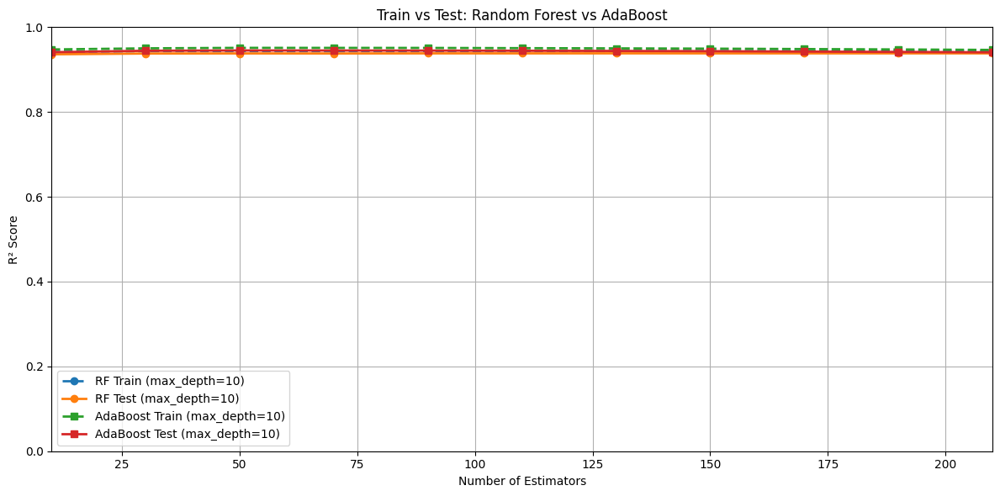

In [37]:
compare_rf_vs_adaboost(X_train, X_test, y_train, y_test, max_depth=10, yLim=0)

When coparing the test vs train on RF and AdaBoost with the same arguments, we can see that both of them are performing really well, however, lets zoom in to see if there is any meaning full difference.

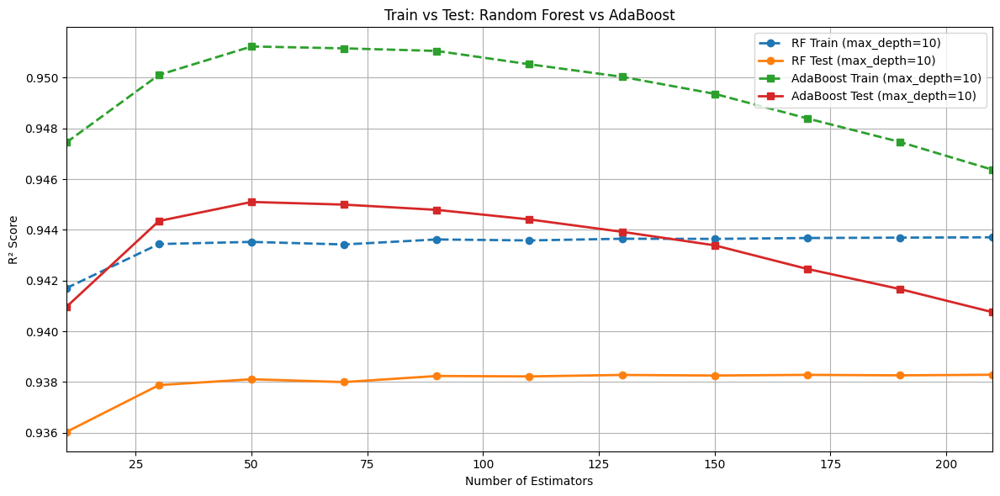

In [38]:
compare_rf_vs_adaboost(X_train, X_test, y_train, y_test, max_depth=10)

With a max depth of 10, both Random Forest and AdaBoost show similar test R² performance. However, AdaBoost slightly outperforms Random Forest in test accuracy up to ~100 estimators before declining, indicating potential overfitting. Random Forest maintains more stable performance across the full estimator range. Still, I'll use the random forest as I want robust and reliable performance with less risk of overfitting

In [39]:

from sklearn.ensemble import StackingRegressor
# Try new base models
base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, max_depth=10, random_state=21)),
    ('lr', LinearRegression()),
]

# Meta-model
meta_model = LinearRegression()

# Stacking
stack_model = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model,
    n_jobs=-1
)

stack_model.fit(X_train, y_train)

from sklearn.metrics import r2_score

y_pred_stack = stack_model.predict(X_test)
r2_stack = r2_score(y_test, y_pred_stack)

print("New Stacking Model R²:", r2_stack)

New Stacking Model R²: 0.9389904109448793


Before the stacking, accuracy was around 0.938**1**. Witch just an increase of 0.0007 I dont think its worth to do the stacking and just use the nice base fine tuned RFR

# Inference

In [40]:
# Example user input
from datetime import datetime

departure_date = datetime(2025, 8, 31)
record_date = datetime(2025, 4, 25)
daysAgo_input = (departure_date - record_date).days

sample_input = pd.DataFrame([{
    'price': 208,
    'airport_distance_km': 2000,
    'near_holiday_-1.0': 0,
    'near_holiday_0.0': 0,
    'near_holiday_1.0': 0,
    'departure_airport': le_dep.transform(['Sofia'])[0],
    'arrival_airport': le_arr.transform(['Eindhoven'])[0],
    'daysAgo': daysAgo_input,
    'departure_weekday': departure_date.weekday()
}])

user_input = sample_input[features]
user_pred = rfr.predict(user_input)[0]
top3_user_preds = np.round([user_pred - 1, user_pred, user_pred + 1]).astype(int)

print("Top 3 estimated best days before departure to buy:")
print(top3_user_preds)

Top 3 estimated best days before departure to buy:
[140 141 142]


----------

The algorhitms seems to perform well enough to call the project a success!

In [41]:
import joblib

# Save your classifier
joblib.dump(rfr, './web-app/FlightPredictionsWebApp/models/flight_model.pkl')

# Save encoders if needed
joblib.dump(le_dep, './web-app/FlightPredictionsWebApp/models/departure_encoder.pkl')
joblib.dump(le_arr, './web-app/FlightPredictionsWebApp/models/arrival_encoder.pkl')

['./web-app/FlightPredictionsWebApp/models/arrival_encoder.pkl']

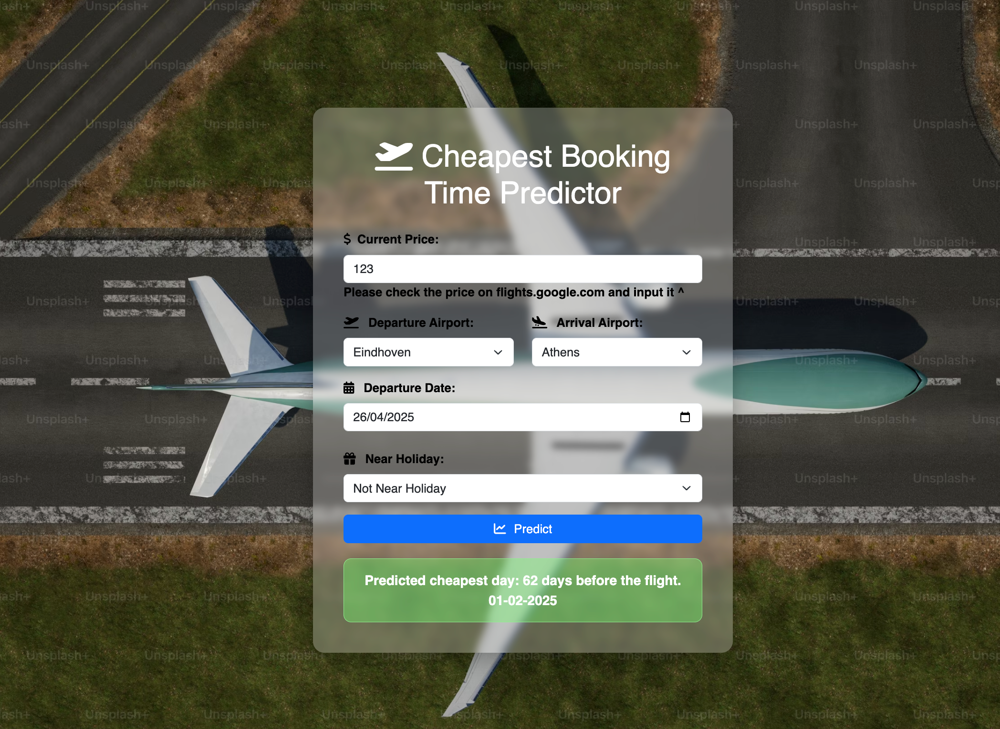

## ✈️ Summary – Iteration 3

What went well:
-	Switched to regression instead of classification, directly predicting the cheapest daysAgo value.
-	Introduced more advanced models: StackingRegressor (Random Forest + Linear Regression), with improved R² scores.
-	Conducted hyperparameter tuning and model comparison (RandomForest, KNN, LR) showing consistent evaluation.

What changed:
-	Added features like departureDay, departureMonth, daysAgo, holiday flags, and timestamp-based data.

-------

In [42]:

from datetime import datetime, timedelta

# Function to generate features for your model
def features_generator(flight_date, purchase_date, current_price, dep_airport_encoded, arr_airport_encoded, airport_distance_km, near_holiday_flags):
    daysAgo = (flight_date - purchase_date).days
    departure_weekday = flight_date.weekday()

    # Correct feature vector: with today's known price
    features = [
        current_price,
        airport_distance_km,
        near_holiday_flags.get(-1.0, 0),
        near_holiday_flags.get(0.0, 0),
        near_holiday_flags.get(1.0, 0),
        dep_airport_encoded,
        arr_airport_encoded,
        daysAgo,
        departure_weekday
    ]
    return features

# Function to find the best future purchase day
def find_best_future_daysAgo(model, flight_date, today_date, current_price, dep_airport_encoded, arr_airport_encoded, airport_distance_km, near_holiday_flags):
    best_daysAgo = None
    best_prediction = float('inf')

    days_until_flight = (flight_date - today_date).days

    for daysAgo_candidate in range(days_until_flight, -1, -1):  # from today down to flight day
        candidate_purchase_date = flight_date - timedelta(days=daysAgo_candidate)

        if candidate_purchase_date < today_date:
            continue  # skip past dates

        features = features_generator(
            flight_date,
            candidate_purchase_date,
            current_price,
            dep_airport_encoded,
            arr_airport_encoded,
            airport_distance_km,
            near_holiday_flags
        )

        prediction = model.predict([features])[0]

        if prediction < best_prediction:
            best_prediction = prediction
            best_daysAgo = daysAgo_candidate

    return best_daysAgo, best_prediction

# Example usage:
flight_date = datetime(2025, 7, 5)
today_date = datetime.today().replace(hour=0, minute=0, second=0, microsecond=0)

current_price = 123  # Known today
dep_airport_encoded = le_dep.transform(['Eindhoven'])[0]
arr_airport_encoded = le_arr.transform(['Sofia'])[0]
airport_distance_km = 2200
near_holiday_flags = {-1.0: 0, 0.0: 0, 1.0: 0}

best_daysAgo, best_prediction = find_best_future_daysAgo(
    rfr,  # your model
    flight_date,
    today_date,
    current_price,
    dep_airport_encoded,
    arr_airport_encoded,
    airport_distance_km,
    near_holiday_flags
)

print(f"✅ Best future day to buy: {best_daysAgo} days before departure")
print(f"✅ Predicted best daysAgo value: {best_prediction:.2f}")


✅ Best future day to buy: 40 days before departure
✅ Predicted best daysAgo value: 48.05


/Users/bobby/GitHub/Flight-Prices-Predicitons/myenv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/Users/bobby/GitHub/Flight-Prices-Predicitons/myenv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/Users/bobby/GitHub/Flight-Prices-Predicitons/myenv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/Users/bobby/GitHub/Flight-Prices-Predicitons/myenv/lib/python3.13/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/Users/bobby/GitHub/Flight-Prices-Predicitons/my

--------

# Bonus: Clustering proof of concept
The project already contains most of the knowledge learned during the semester, but I'll also try to add clustering just as an exercise, despite the results

In [43]:
main_data

,daysAgo,departureDate,price,departure_airport,arrival_airport,is_public_holiday,is_school_holiday,airline,record_timestamp,airport_distance_km,departure_date_unix,record_timestamp_unix,near_holiday_-1.0,near_holiday_0.0,near_holiday_1.0,departure_weekday,cheapest_day_future
0,65,2025-03-25,80,0,1,False,False,6,2025-01-19,2067.423123,1742860800,1737244800,False,False,False,1,65
1,64,2025-03-25,80,0,1,False,False,6,2025-01-20,2067.423123,1742860800,1737331200,False,False,False,1,65
2,63,2025-03-25,80,0,1,False,False,6,2025-01-21,2067.423123,1742860800,1737417600,False,False,False,1,65
3,62,2025-03-25,88,0,1,False,False,0,2025-01-22,2067.423123,1742860800,1737504000,False,False,False,1,65
4,61,2025-03-25,88,0,1,False,False,0,2025-01-23,2067.423123,1742860800,1737590400,False,False,False,1,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59991,207,2025-10-09,50,1,4,False,False,1,2025-03-16,328.393017,1759968000,1742083200,True,False,False,3,207
59992,206,2025-10-09,50,1,4,False,False,1,2025-03-17,328.393017,1759968000,1742169600,True,False,False,3,207
59993,205,2025-10-09,51,1,4,False,False,1,2025-03-18,328.393017,1759968000,1742256000,True,False,False,3,207
59994,204,2025-10-09,50,1,4,False,False,4,2025-03-19,328.393017,1759968000,1742342400,True,False,False,3,207


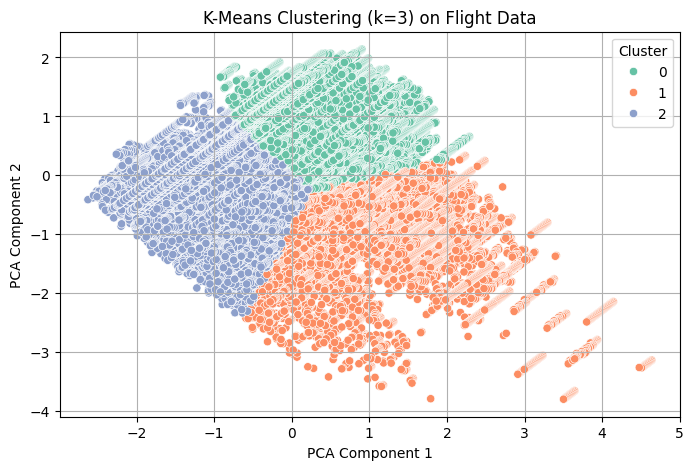

In [44]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Use only valid numerical columns
clustering_features = main_data[['price', 'daysAgo']].dropna()

# Ensure all values are numeric
clustering_features = clustering_features.astype(float)

# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(clustering_features)

# Reduce to 2D with PCA for visualization
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(X_scaled)

plt.figure(figsize=(8, 5))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='Set2')
plt.title('K-Means Clustering (k=3) on Flight Data')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


This PCA scatter plot shows the result of K-Means clustering (with 3 clusters) applied to our flight dataset using price and daysAgo features.


We reduced the data to 2 dimensions using Principal Component Analysis to visualize the clusters. Each color represents a different cluster, and the separation suggests that K-Means successfully found distinct groupings in the data, even though we didn’t provide labels or categories.


This demonstrates that our data has underlying structure, and clustering can potentially help us identify flight patterns — such as typical pricing windows or purchase behaviors — in future feature exploration.


Cluster 0 might represent flights purchased early with stable prices, Cluster 1 could reflect last-minute purchases with volatile prices, and Cluster 2 could lie in between. But since this is unsupervised and we didn’t evaluate it for meaning, these are just hypothetical interpretations.

## Comparing different clustering alorhitms

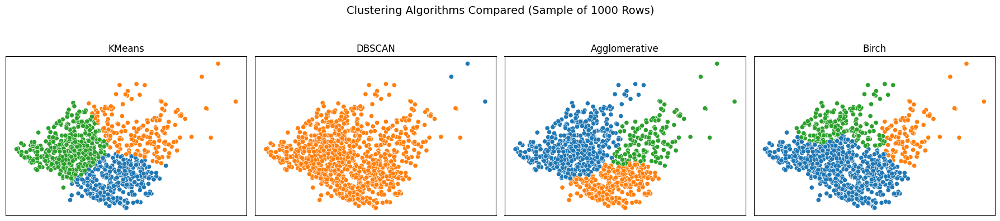

In [46]:
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Sample the data to speed up clustering
sample = main_data[['price', 'daysAgo']].dropna().astype(float).sample(n=1000, random_state=42)

# Normalize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(sample)

# PCA for visualization
X_pca = PCA(n_components=2, random_state=42).fit_transform(X_scaled)

# Models to compare (fast ones)
models = [
    ("KMeans", KMeans(n_clusters=3, random_state=42)),
    ("DBSCAN", DBSCAN(eps=0.8, min_samples=5)),
    ("Agglomerative", AgglomerativeClustering(n_clusters=3)),
    ("Birch", Birch(n_clusters=3)),
]

# Plotting
fig, axes = plt.subplots(1, len(models), figsize=(18, 4))
axes = axes.flatten()

for ax, (name, model) in zip(axes, models):
    try:
            
        labels = model.fit(X_scaled).fit_predict(X_scaled)

        sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=labels, palette='tab10', ax=ax, legend=False)
        ax.set_title(name)
        ax.set_xticks([])
        ax.set_yticks([])
    except Exception as e:
        ax.set_title(f"{name} failed")
        ax.text(0.5, 0.5, str(e), ha='center', va='center', fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Clustering Algorithms Compared (Sample of 1000 Rows)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()

We applied and compared several clustering algorithms (KMeans, DBSCAN, Agglomerative Clustering, Birch) on a sample of 1000 flight records using only price and daysAgo as features.

KMeans and Agglomerative Clustering both formed well-separated clusters, showing a clear partition of the dataset into three groups, which may reflect different ticket pricing strategies over time.

Birch also identified three groups, but with some overlap and less distinct boundaries.

DBSCAN failed to detect meaningful structure in this context, assigning nearly all points to a single cluster — likely due to its sensitivity to density and the choice of parameters (eps, min_samples).

Overall, KMeans provided the clearest and most stable segmentation in our case, suggesting it is a suitable choice for simple, shape-based clustering on this type of data.